# EXPLORATORY DATA ANALYSIS

In [1]:
#IMPORT LIBARARIES

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import sklearn
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

from scipy.stats import norm, skew
%matplotlib inline

In [2]:
#LOAD DATA FILES
price_data = pd.read_csv('./price_data.csv')
client_data = pd.read_csv('./client_data.csv')

In [3]:
price_data.head(3)

,id,price_date,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
0,038af19179925da21a25619c5a24b745,2015-01-01,0.151367,0.0,0.0,44.266931,0.0,0.0
1,038af19179925da21a25619c5a24b745,2015-02-01,0.151367,0.0,0.0,44.266931,0.0,0.0
2,038af19179925da21a25619c5a24b745,2015-03-01,0.151367,0.0,0.0,44.266931,0.0,0.0


In [4]:
client_data.head(3)

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,...,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.00,...,t,0.0,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1
1,d29c2c54acc38ff3c0614d0a653813dd,MISSING,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,...,f,0.0,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,0
2,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,...,f,0.0,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,0


 # Descriptive statistics of data
 Understanding the data type that is to be dealt with.

In [5]:
print(price_data.info(),client_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193002 entries, 0 to 193001
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  193002 non-null  object 
 1   price_date          193002 non-null  object 
 2   price_off_peak_var  193002 non-null  float64
 3   price_peak_var      193002 non-null  float64
 4   price_mid_peak_var  193002 non-null  float64
 5   price_off_peak_fix  193002 non-null  float64
 6   price_peak_fix      193002 non-null  float64
 7   price_mid_peak_fix  193002 non-null  float64
dtypes: float64(6), object(2)
memory usage: 11.8+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14606 entries, 0 to 14605
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              14606 non-null  object 
 1   channel_sales                   14606 no

In [6]:
for col in client_data.columns:
    print(f"{col} - {client_data[col].nunique()}")

id - 14606
channel_sales - 8
cons_12m - 11065
cons_gas_12m - 2112
cons_last_month - 4751
date_activ - 1796
date_end - 368
date_modif_prod - 2129
date_renewal - 386
forecast_cons_12m - 13993
forecast_cons_year - 4218
forecast_discount_energy - 12
forecast_meter_rent_12m - 3528
forecast_price_energy_off_peak - 516
forecast_price_energy_peak - 329
forecast_price_pow_off_peak - 41
has_gas - 2
imp_cons - 7752
margin_gross_pow_ele - 2391
margin_net_pow_ele - 2391
nb_prod_act - 10
net_margin - 11965
num_years_antig - 13
origin_up - 6
pow_max - 698
churn - 2


In [7]:
for col in price_data.columns:
    print(f"{col} - {price_data[col].nunique()}")

id - 16096
price_date - 12
price_off_peak_var - 1853
price_peak_var - 1189
price_mid_peak_var - 711
price_off_peak_fix - 66
price_peak_fix - 31
price_mid_peak_fix - 28


In [8]:
client_data['channel_sales'].value_counts()

foosdfpfkusacimwkcsosbicdxkicaua    6754
MISSING                             3725
lmkebamcaaclubfxadlmueccxoimlema    1843
usilxuppasemubllopkaafesmlibmsdf    1375
ewpakwlliwisiwduibdlfmalxowmwpci     893
sddiedcslfslkckwlfkdpoeeailfpeds      11
epumfxlbckeskwekxbiuasklxalciiuu       3
fixdbufsefwooaasfcxdxadsiekoceaa       2
Name: channel_sales, dtype: int64

Data Statistics

In [9]:
price_data.describe()

,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
count,193002.000000,193002.000000,193002.000000,193002.000000,193002.000000,193002.000000
mean,0.141027,0.054630,0.030496,43.334477,10.622875,6.409984
std,0.025032,0.049924,0.036298,5.410297,12.841895,7.773592
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.125976,0.000000,0.000000,40.728885,0.000000,0.000000
50%,0.146033,0.085483,0.000000,44.266930,0.000000,0.000000
75%,0.151635,0.101673,0.072558,44.444710,24.339581,16.226389
max,0.280700,0.229788,0.114102,59.444710,36.490692,17.458221


In [10]:
client_data.describe()

,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,churn
count,1.460600e+04,1.460600e+04,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000
mean,1.592203e+05,2.809238e+04,16090.269752,1868.614880,1399.762906,0.966726,63.086871,0.137283,0.050491,43.130056,152.786896,24.565121,24.562517,1.292346,189.264522,4.997809,18.135136,0.097152
std,5.734653e+05,1.629731e+05,64364.196422,2387.571531,3247.786255,5.108289,66.165783,0.024623,0.049037,4.485988,341.369366,20.231172,20.230280,0.709774,311.798130,1.611749,13.534743,0.296175
min,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,3.300000,0.000000
25%,5.674750e+03,0.000000e+00,0.000000,494.995000,0.000000,0.000000,16.180000,0.116340,0.000000,40.606701,0.000000,14.280000,14.280000,1.000000,50.712500,4.000000,12.500000,0.000000
50%,1.411550e+04,0.000000e+00,792.500000,1112.875000,314.000000,0.000000,18.795000,0.143166,0.084138,44.311378,37.395000,21.640000,21.640000,1.000000,112.530000,5.000000,13.856000,0.000000
75%,4.076375e+04,0.000000e+00,3383.000000,2401.790000,1745.750000,0.000000,131.030000,0.146348,0.098837,44.311378,193.980000,29.880000,29.880000,1.000000,243.097500,6.000000,19.172500,0.000000
max,6.207104e+06,4.154590e+06,771203.000000,82902.830000,175375.000000,30.000000,599.310000,0.273963,0.195975,59.266378,15042.790000,374.640000,374.640000,32.000000,24570.650000,13.000000,320.000000,1.000000


In [11]:
price_data.skew()

price_off_peak_var   -0.311879
price_peak_var       -0.133292
price_mid_peak_var    0.365508
price_off_peak_fix   -2.889775
price_peak_fix        0.471709
price_mid_peak_fix    0.433076
dtype: float64

In [12]:
client_data.skew()

cons_12m                           5.997308
cons_gas_12m                       9.597530
cons_last_month                    6.391407
forecast_cons_12m                  7.155853
forecast_cons_year                16.587990
forecast_discount_energy           5.155098
forecast_meter_rent_12m            1.505148
forecast_price_energy_off_peak    -0.119586
forecast_price_energy_peak        -0.014331
forecast_price_pow_off_peak       -4.998772
imp_cons                          13.198799
margin_gross_pow_ele               4.472632
margin_net_pow_ele                 4.473326
nb_prod_act                        8.636878
net_margin                        36.569515
num_years_antig                    1.446214
pow_max                            5.786785
churn                              2.720715
dtype: float64

most of the data are highly skew. A log of values can be taken or other methods can be used to correct this.

In [13]:
#Date column reformated to more suitable fields.
#converting objects to int
dates =['date_activ', 'date_end','date_modif_prod','date_renewal'] 
for date in dates:
    client_data[date] = pd.to_datetime(client_data[date], format = "%Y-%m-%d")
    client_data['year'] = client_data[date].apply(lambda x: x.year)
    client_data['month'] = client_data[date].apply(lambda x: x.month)
    client_data['day'] = client_data[date].apply(lambda x: x.day)
    
price_data['price_date'] = pd.to_datetime(price_data['price_date'], format = "%Y-%m-%d")
price_data['year'] = price_data['price_date'].apply(lambda x: x.year)
price_data['month'] = price_data['price_date'].apply(lambda x: x.month)
price_data['day'] = price_data['price_date'].apply(lambda x: x.day)

# Data Visualization

In [14]:
def plot_stacked_bars(dataframe, title_, size_=(18, 10), rot_=0, legend_="upper right"):
    """
    Plot stacked bars with annotations
    """
    ax = dataframe.plot(
        kind="bar",
        stacked=True,
        figsize=size_,
        rot=rot_,
        title=title_
    )

    # Annotate bars
    annotate_stacked_bars(ax, textsize=14)
    # Rename legend
    plt.legend(["Retention", "Churn"], loc=legend_)
    # Labels
    plt.ylabel("Company base (%)")
    plt.show()

def annotate_stacked_bars(ax, pad=0.99, colour="white", textsize=13):
    """
    Add value annotations to the bars
    """

    # Iterate over the plotted rectanges/bars
    for p in ax.patches:
        
        # Calculate annotation
        value = str(round(p.get_height(),1))
        # If value is 0 do not annotate
        if value == '0.0':
            continue
        ax.annotate(
            value,
            ((p.get_x()+ p.get_width()/2)*pad-0.05, (p.get_y()+p.get_height()/2)*pad),
            color=colour,
            size=textsize
        )

def plot_distribution(dataframe, column, ax, bins_=50):
    """
    Plot variable distirbution in a stacked histogram of churned or retained company
    """
    # Create a temporal dataframe with the data to be plot
    temp = pd.DataFrame({"Retention": dataframe[dataframe["churn"]==0][column],
    "Churn":dataframe[dataframe["churn"]==1][column]})
    # Plot the histogram
    temp[["Retention","Churn"]].plot(kind='hist', bins=bins_, ax=ax, stacked=True)
    # X-axis label
    ax.set_xlabel(column)
    # Change the x-axis to plain style
    ax.ticklabel_format(style='plain', axis='x')

churn status

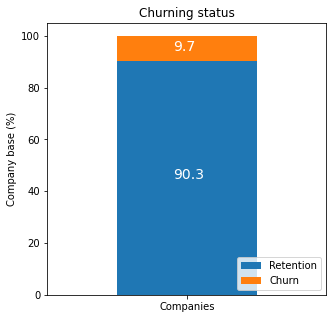

In [15]:
churn = client_data[['id', 'churn']]
churn.columns = ['Companies', 'churn']
churn_total = churn.groupby(churn['churn']).count()
churn_percentage = churn_total / churn_total.sum() * 100
plot_stacked_bars(churn_percentage.transpose(), "Churning status", (5, 5), legend_="lower right")

Consumption status

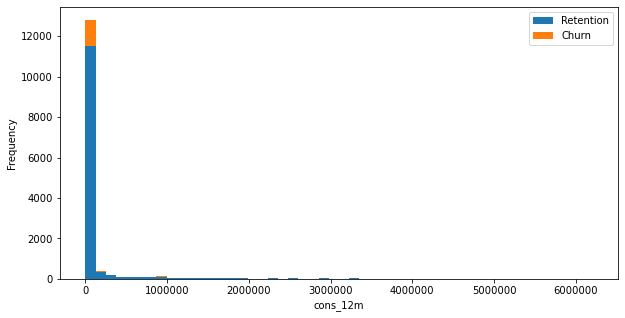

In [16]:
consumption = client_data[['id', 'cons_12m', 'cons_gas_12m', 'cons_last_month', 'imp_cons', 'has_gas', 'churn']]

fig, axs = plt.subplots(nrows=1, figsize=(10, 5))

plot_distribution(consumption, 'cons_12m', axs)


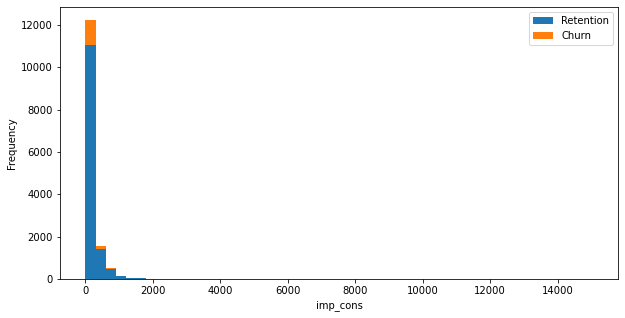

In [17]:
consumption = client_data[['id', 'cons_12m', 'cons_gas_12m', 'cons_last_month', 'imp_cons', 'has_gas', 'churn']]

fig, axs = plt.subplots(nrows=1, figsize=(10, 5))

plot_distribution(consumption, 'imp_cons', axs)


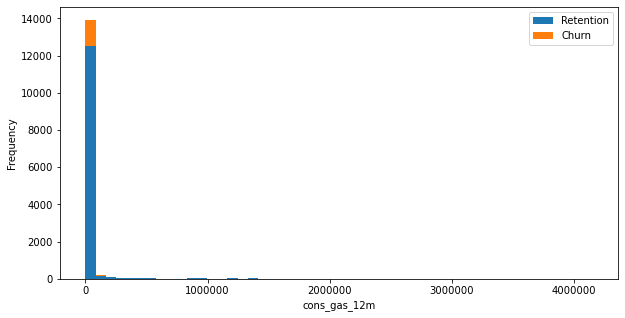

In [18]:
consumption = client_data[['id', 'cons_12m', 'cons_gas_12m', 'cons_last_month', 'imp_cons', 'has_gas', 'churn']]

fig, axs = plt.subplots(nrows=1, figsize=(10, 5))
plot_distribution(consumption, 'cons_gas_12m', axs)

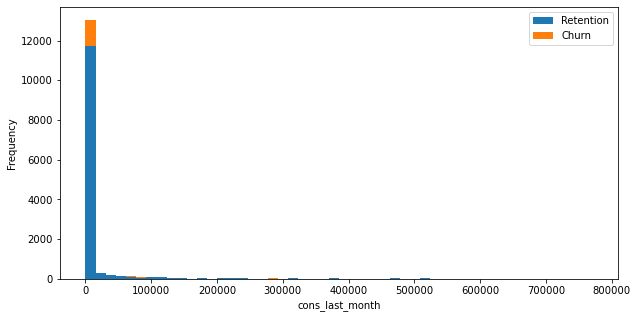

In [19]:
consumption = client_data[['id', 'cons_12m', 'cons_gas_12m', 'cons_last_month', 'imp_cons', 'has_gas', 'churn']]

fig, axs = plt.subplots(nrows=1, figsize=(10, 5))

plot_distribution(consumption, 'cons_last_month', axs)


From the above visualition it can be oberved that considerable amount of datas are positively . this may be due to outliers.

Closer look at the sales channel

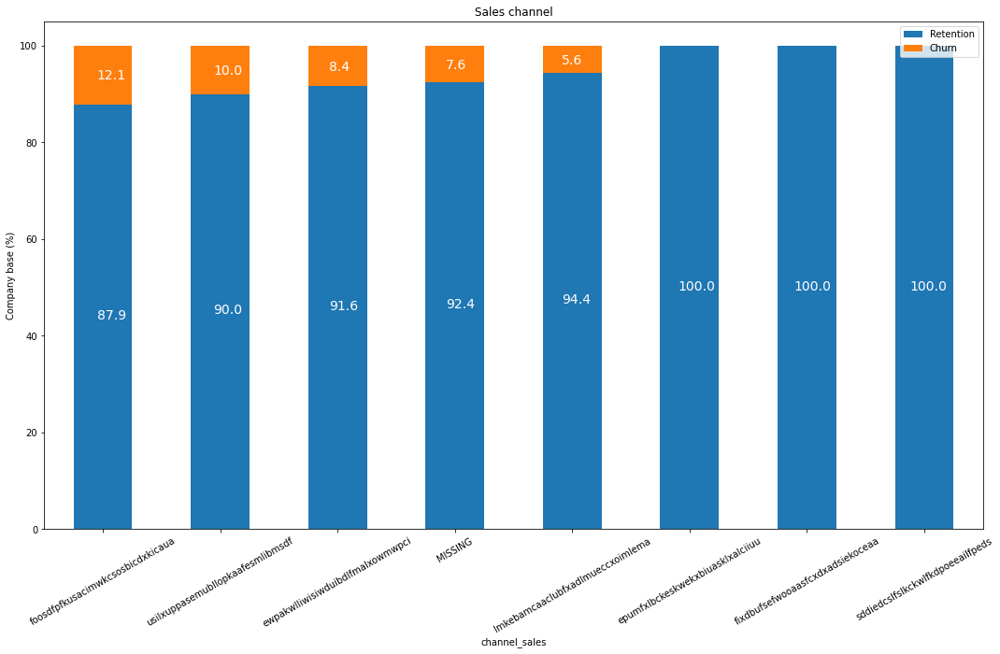

In [20]:
channel = client_data[['id', 'channel_sales', 'churn']]
channel = channel.groupby([channel['channel_sales'], channel['churn']])['id'].count().unstack(level=1).fillna(0)
channel_churn = (channel.div(channel.sum(axis=1), axis=0) * 100).sort_values(by=[1], ascending=False)
plot_stacked_bars(channel_churn, 'Sales channel', rot_=30)

From above it can be observed that not all sales channels are dealing with churn costumers, which is a an important indication to probably another hypothesis. Although the larger volumes of sales are also from the affected sales channels. it will be intesting to understand the ratio of churn to total sales per channel.

Forecast

In [21]:
forecast = client_data[
["id",'forecast_cons_12m','forecast_cons_year','forecast_discount_energy','forecast_meter_rent_12m',
 'forecast_price_energy_off_peak','forecast_price_energy_peak','forecast_price_pow_off_peak',"churn"
]
]


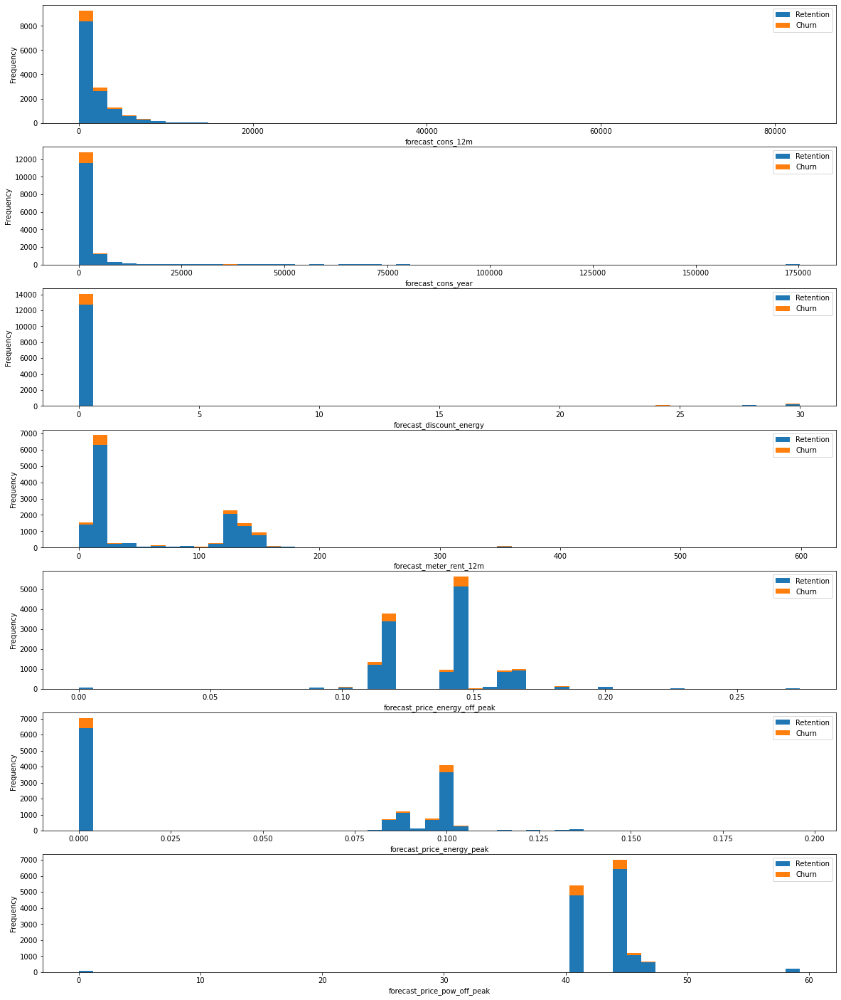

In [22]:
fig, axs = plt.subplots(nrows=7, figsize=(20, 25))

# Plot histogram
plot_distribution(client_data, "forecast_cons_12m", axs[0])
plot_distribution(client_data, "forecast_cons_year", axs[1])
plot_distribution(client_data, "forecast_discount_energy", axs[2])
plot_distribution(client_data, "forecast_meter_rent_12m", axs[3])
plot_distribution(client_data, 'forecast_price_energy_off_peak', axs[4])
plot_distribution(client_data, 'forecast_price_energy_peak', axs[5])
plot_distribution(client_data, 'forecast_price_pow_off_peak', axs[6])


In [23]:
corr_data = client_data.corr()
corr_data

,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,...,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,churn,year,month,day
cons_12m,1.000000,0.488474,0.968212,0.193947,0.167093,-0.043282,0.065268,-0.007748,0.145908,-0.026566,...,-0.011926,-0.011905,0.154251,0.133614,-0.003565,0.082889,-0.045968,0.009908,-0.045194,-0.007628
cons_gas_12m,0.488474,1.000000,0.507007,0.084359,0.080934,-0.012595,0.041393,-0.017684,0.074002,-0.020558,...,0.006868,0.006852,0.239387,0.070867,-0.013815,0.054317,-0.037957,0.020409,-0.007864,-0.004871
cons_last_month,0.968212,0.507007,1.000000,0.177773,0.193574,-0.040874,0.057476,-0.005187,0.136802,-0.023017,...,-0.011498,-0.011477,0.169099,0.121835,-0.003677,0.074529,-0.045284,0.016276,-0.041012,-0.012698
forecast_cons_12m,0.193947,0.084359,0.177773,1.000000,0.647727,0.058435,0.305627,-0.135646,0.254056,-0.018477,...,-0.023220,-0.023231,0.055915,0.768537,0.021283,0.393946,0.012949,-0.029218,-0.048030,-0.002093
forecast_cons_year,0.167093,0.080934,0.193574,0.647727,1.000000,0.008518,0.276009,-0.158012,0.251005,-0.044190,...,-0.010759,-0.010727,0.040426,0.464928,0.048248,0.309647,-0.002558,0.007216,-0.061111,-0.008297
forecast_discount_energy,-0.043282,-0.012595,-0.040874,0.058435,0.008518,1.000000,-0.008388,0.353735,0.059318,0.048024,...,0.241142,0.240421,0.106812,0.079784,-0.070697,-0.005032,0.017026,-0.166071,-0.039639,0.032110
forecast_meter_rent_12m,0.065268,0.041393,0.057476,0.305627,0.276009,-0.008388,1.000000,-0.579353,0.706376,-0.203089,...,0.183509,0.183566,0.018109,0.275830,0.071558,0.618549,0.044245,0.052812,-0.078946,-0.048466
forecast_price_energy_off_peak,-0.007748,-0.017684,-0.005187,-0.135646,-0.158012,0.353735,-0.579353,1.000000,-0.330138,0.630377,...,0.094498,0.094216,0.035093,-0.135107,-0.168095,-0.384397,-0.010837,-0.122688,0.037048,0.039683
forecast_price_energy_peak,0.145908,0.074002,0.136802,0.254056,0.251005,0.059318,0.706376,-0.330138,1.000000,-0.242017,...,0.165483,0.165560,0.044141,0.234942,0.080260,0.411532,0.029315,-0.013850,-0.051307,-0.043835
forecast_price_pow_off_peak,-0.026566,-0.020558,-0.023017,-0.018477,-0.044190,0.048024,-0.203089,0.630377,-0.242017,1.000000,...,-0.061869,-0.061925,-0.005335,-0.072623,-0.120136,-0.095897,0.014778,0.002235,0.024436,-0.009897


Imported AutoViz_Class version: 0.1.26. Now you can save all charts in html format:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Note: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
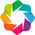

In [24]:
#importing Autoviz class
from autoviz.AutoViz_Class import AutoViz_Class#Instantiate the AutoViz class
AV = AutoViz_Class()

    max_rows_analyzed is smaller than dataset shape 193002...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 8)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    8 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Plots = 21


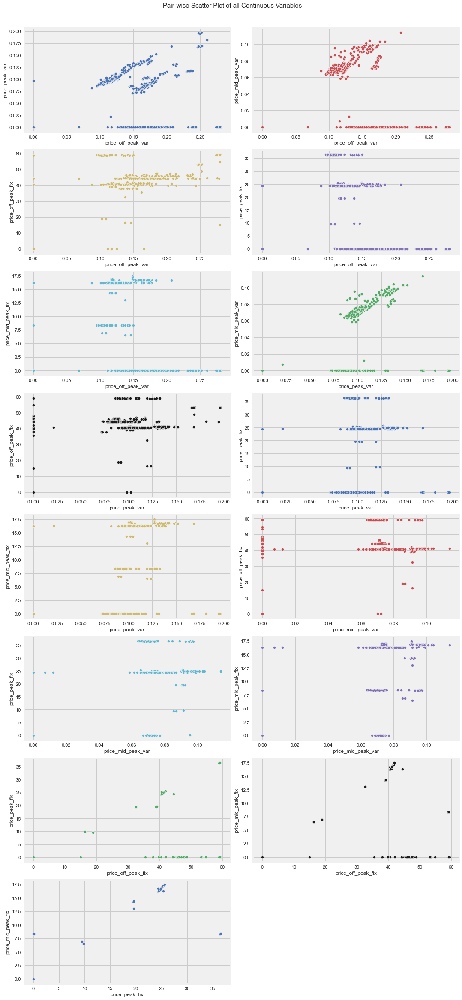

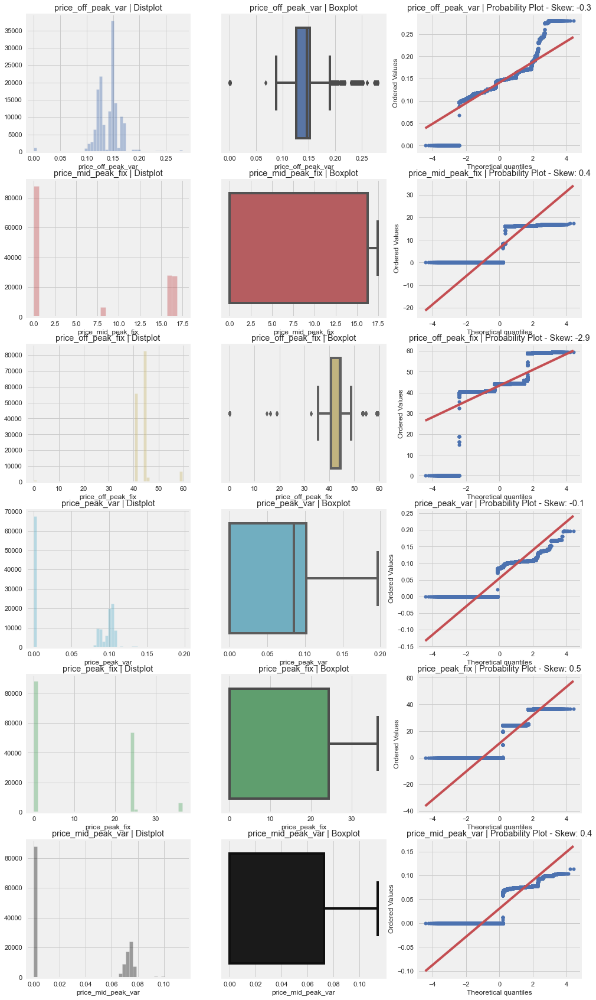

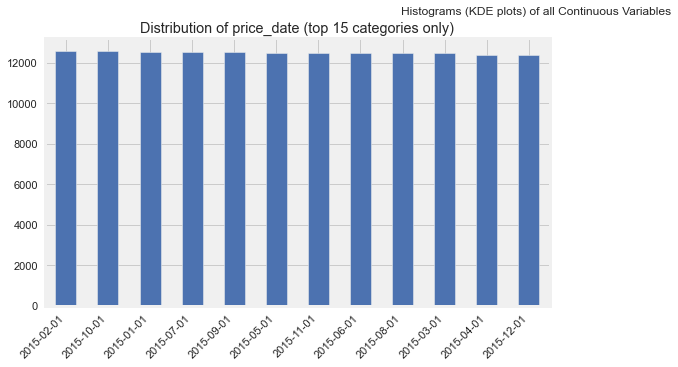

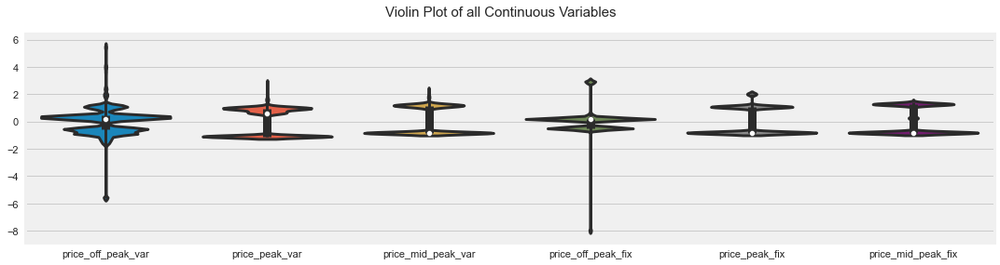

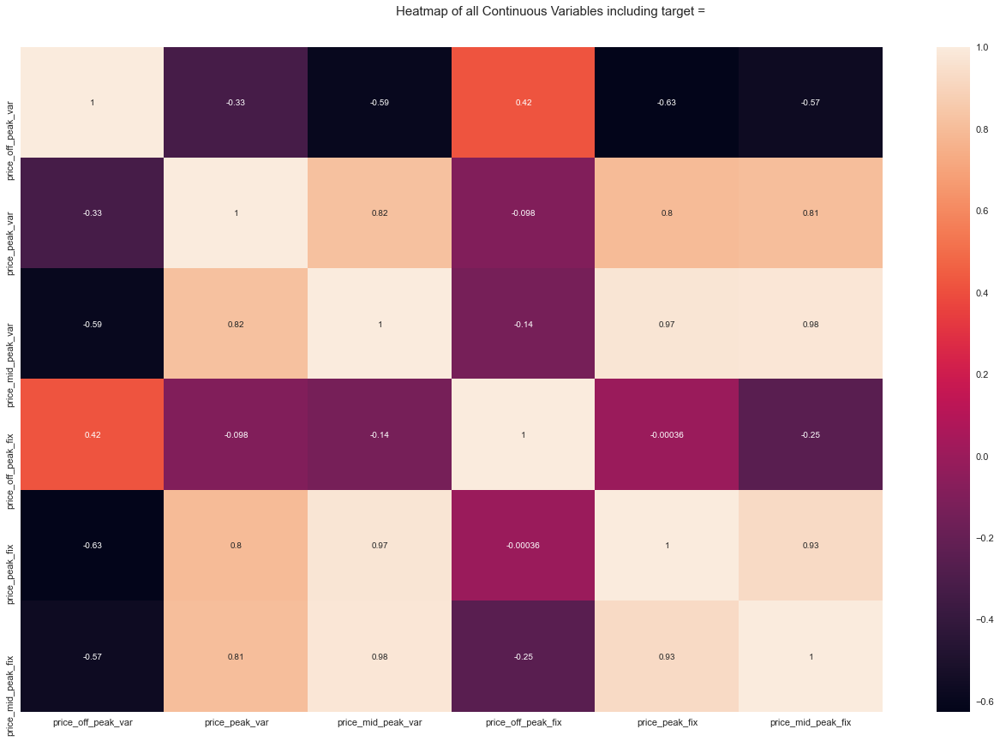

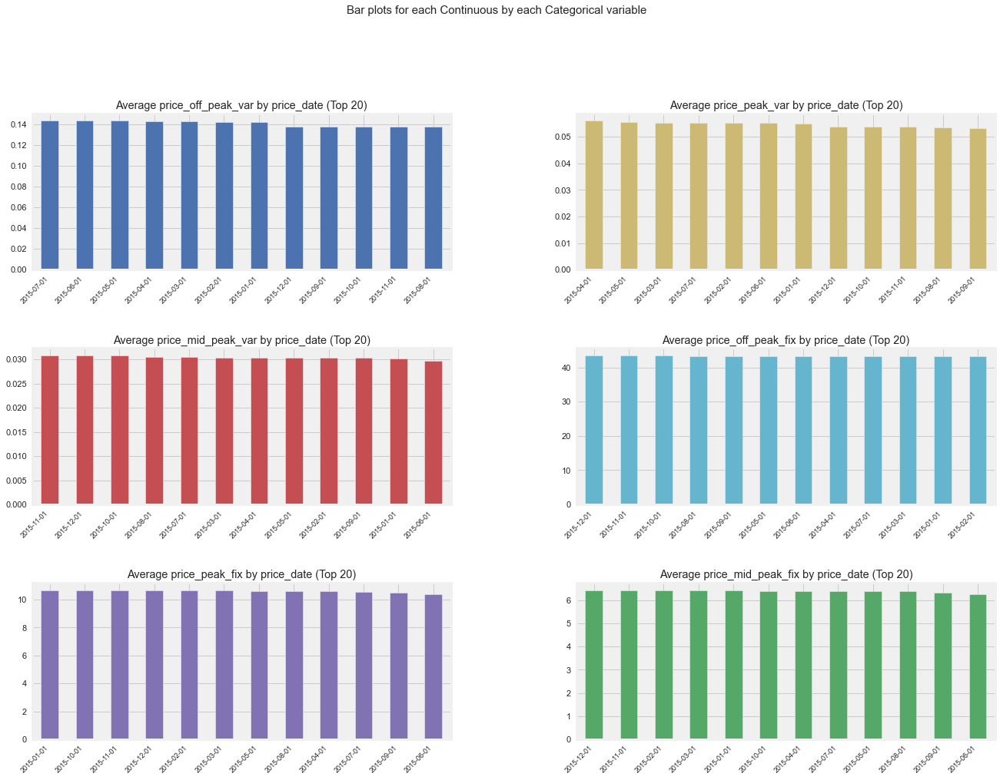

Could not draw wordcloud plot for id
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [25]:
df = AV.AutoViz('./price_data.csv')

Shape of your Data Set loaded: (14606, 26)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    26 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 66


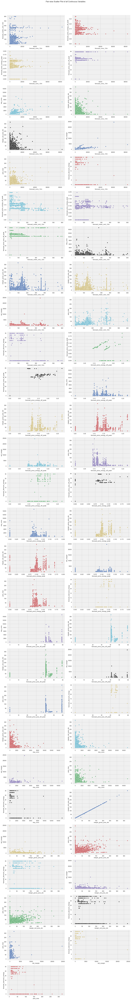

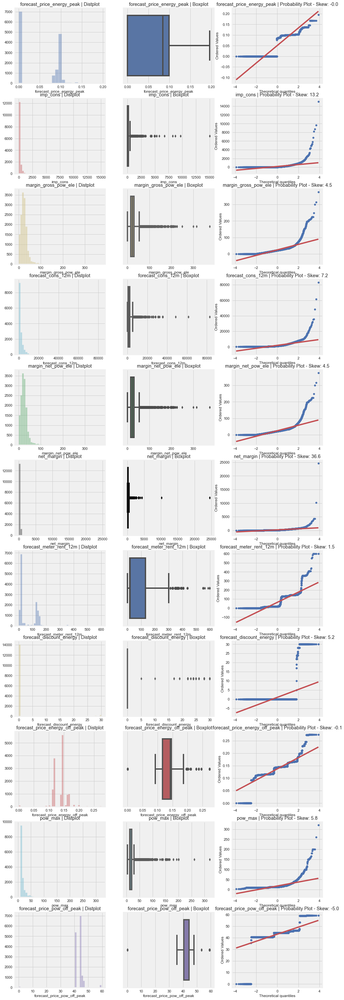

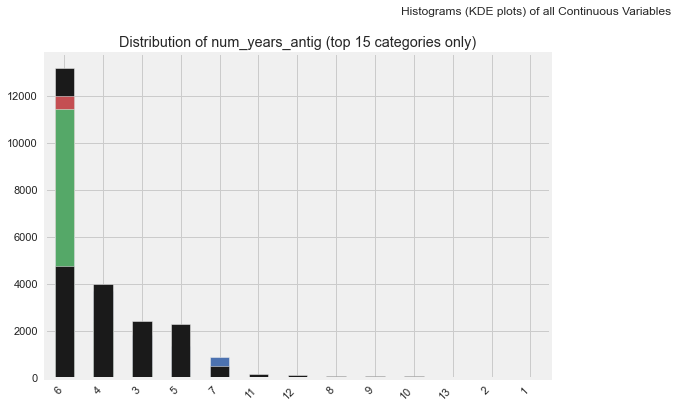

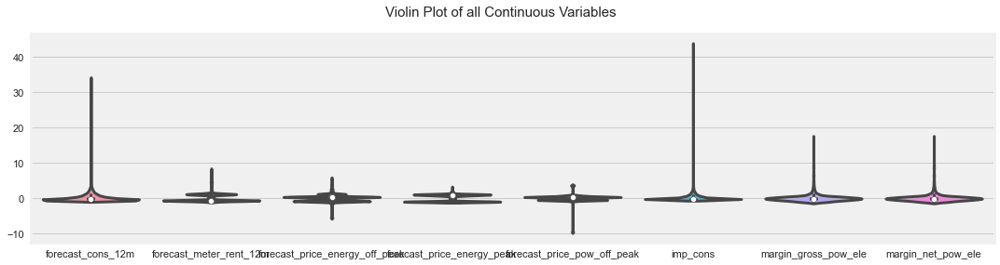

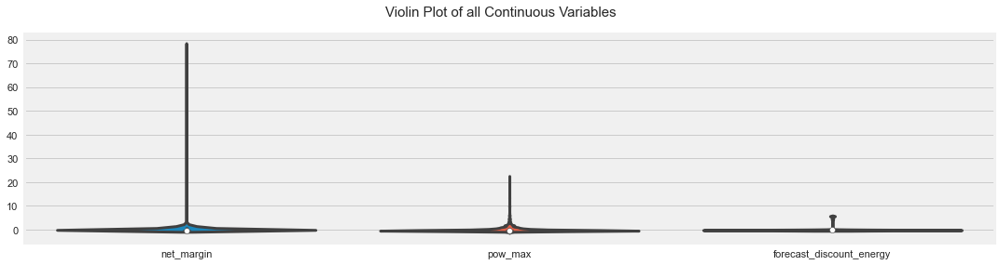

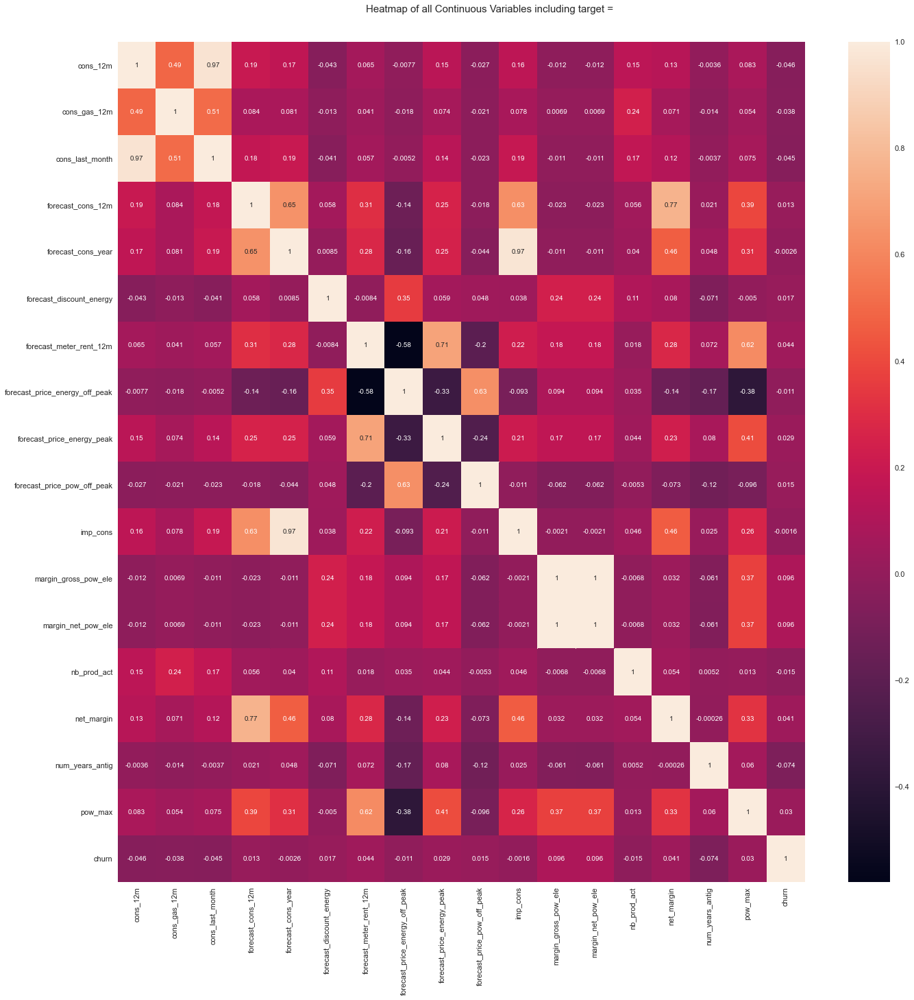

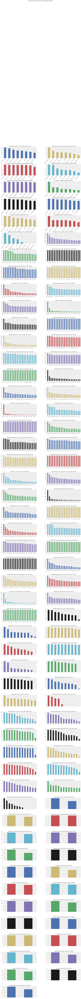

Could not draw wordcloud plot for date_activ
Could not draw wordcloud plot for date_end
Could not draw wordcloud plot for date_modif_prod
Could not draw wordcloud plot for date_renewal
Could not draw wordcloud plot for origin_up
Time to run AutoViz = 83 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [26]:
df = AV.AutoViz('./client_data.csv')

Investigate the price hypothesis.
Find out if price is a driving factors for the churned costumers.
To begin, price sensitivity is computed

In [27]:
# Create yearly sensitivity features
var_year = price_data.groupby(['id', 'price_date']).mean().groupby(['id']).var().reset_index()

In [28]:
# Create last 6 months sensitivity features
var_6m = price_data[
price_data['price_date'] > '2015-06-01'].groupby(['id', 'price_date']).mean().groupby(['id']).var().reset_index()

In [29]:
var_6m.head()

,id,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix,year,month,day
0,0002203ffbb812588b632b9e628cc38d,0.000011,0.000003,4.860000e-10,0.0,0.0,0.0,0.0,3.5,0.0
1,0004351ebdd665e6ee664792efc4fd13,0.000003,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,3.5,0.0
2,0010bcc39e42b3c2131ed2ce55246e3c,0.000003,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,3.5,0.0
3,0010ee3855fdea87602a5b7aba8e42de,0.000011,0.000003,4.860000e-10,0.0,0.0,0.0,0.0,3.5,0.0
4,00114d74e963e47177db89bc70108537,0.000003,0.000000,0.000000e+00,0.0,0.0,0.0,0.0,3.5,0.0


In [30]:
var_year.head()

,id,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix,year,month,day
0,0002203ffbb812588b632b9e628cc38d,0.000016,0.000004,1.871602e-06,4.021438e-03,0.001448,0.000643,0.0,13.0,0.0
1,0004351ebdd665e6ee664792efc4fd13,0.000005,0.000000,0.000000e+00,7.661891e-03,0.000000,0.000000,0.0,13.0,0.0
2,0010bcc39e42b3c2131ed2ce55246e3c,0.000676,0.000000,0.000000e+00,5.965909e-01,0.000000,0.000000,0.0,13.0,0.0
3,0010ee3855fdea87602a5b7aba8e42de,0.000025,0.000007,1.627620e-07,7.238536e-03,0.002606,0.001158,0.0,13.0,0.0
4,00114d74e963e47177db89bc70108537,0.000005,0.000000,0.000000e+00,3.490909e-13,0.000000,0.000000,0.0,13.0,0.0


In [31]:
# Rename columns
var_year = var_year.rename(
columns={
"price_p1_var": "price_off_peak_var",
"price_p2_var": "price_peak_var",
"price_p3_var": "price_mid_peak_var",
"price_p1_fix": "price_off_peak_fix",
"price_p2_fix": "price_peak_fix",
"price_p3_fix": "price_mid_peak_fix"
}
)
var_year["price_off_peak"] = var_year["price_off_peak_var"] +var_year["price_off_peak_fix"]
var_year["price_peak"] = var_year["price_peak_var"] +var_year["price_peak_fix"]
var_year["price_mid_peak"] = var_year["price_mid_peak_var"] +var_year["price_mid_peak_fix"]
var_6m = var_6m.rename(
columns={
"price_p1_var": "price_off_peak_var",
"price_p2_var": "price_peak_var",
"price_p3_var": "price_mid_peak_var",
"price_p1_fix": "price_off_peak_fix",
"price_p2_fix": "price_peak_fix",
"price_p3_fix": "price_mid_peak_fix"
}
)
var_6m["price_off_peak"] = var_6m["price_off_peak_var"] +var_6m["price_off_peak_fix"]
var_6m["price_peak"] = var_6m["price_peak_var"] +var_6m["price_peak_fix"]
var_6m["price_mid_peak"] = var_6m["price_mid_peak_var"] +var_6m["price_mid_peak_fix"]

# Merge into 1 dataframe
price_features = pd.merge(var_year, var_6m, on='id')

In [32]:
price_features.head()

,id,price_off_peak_var_x,price_peak_var_x,price_mid_peak_var_x,price_off_peak_fix_x,price_peak_fix_x,price_mid_peak_fix_x,year_x,month_x,day_x,...,price_mid_peak_var_y,price_off_peak_fix_y,price_peak_fix_y,price_mid_peak_fix_y,year_y,month_y,day_y,price_off_peak_y,price_peak_y,price_mid_peak_y
0,0002203ffbb812588b632b9e628cc38d,0.000016,0.000004,1.871602e-06,4.021438e-03,0.001448,0.000643,0.0,13.0,0.0,...,4.860000e-10,0.0,0.0,0.0,0.0,3.5,0.0,0.000011,0.000003,4.860000e-10
1,0004351ebdd665e6ee664792efc4fd13,0.000005,0.000000,0.000000e+00,7.661891e-03,0.000000,0.000000,0.0,13.0,0.0,...,0.000000e+00,0.0,0.0,0.0,0.0,3.5,0.0,0.000003,0.000000,0.000000e+00
2,0010bcc39e42b3c2131ed2ce55246e3c,0.000676,0.000000,0.000000e+00,5.965909e-01,0.000000,0.000000,0.0,13.0,0.0,...,0.000000e+00,0.0,0.0,0.0,0.0,3.5,0.0,0.000003,0.000000,0.000000e+00
3,0010ee3855fdea87602a5b7aba8e42de,0.000025,0.000007,1.627620e-07,7.238536e-03,0.002606,0.001158,0.0,13.0,0.0,...,4.860000e-10,0.0,0.0,0.0,0.0,3.5,0.0,0.000011,0.000003,4.860000e-10
4,00114d74e963e47177db89bc70108537,0.000005,0.000000,0.000000e+00,3.490909e-13,0.000000,0.000000,0.0,13.0,0.0,...,0.000000e+00,0.0,0.0,0.0,0.0,3.5,0.0,0.000003,0.000000,0.000000e+00


In [33]:
#merging the churn data on id to price_features
price_analysis = pd.merge(price_features, client_data[['id', 'churn']], on='id')
price_analysis.head()

,id,price_off_peak_var_x,price_peak_var_x,price_mid_peak_var_x,price_off_peak_fix_x,price_peak_fix_x,price_mid_peak_fix_x,year_x,month_x,day_x,...,price_off_peak_fix_y,price_peak_fix_y,price_mid_peak_fix_y,year_y,month_y,day_y,price_off_peak_y,price_peak_y,price_mid_peak_y,churn
0,0002203ffbb812588b632b9e628cc38d,0.000016,0.000004,0.000002,4.021438e-03,0.001448,0.000643,0.0,13.0,0.0,...,0.0,0.0,0.0,0.0,3.5,0.0,0.000011,0.000003,4.860000e-10,0
1,0004351ebdd665e6ee664792efc4fd13,0.000005,0.000000,0.000000,7.661891e-03,0.000000,0.000000,0.0,13.0,0.0,...,0.0,0.0,0.0,0.0,3.5,0.0,0.000003,0.000000,0.000000e+00,0
2,0010bcc39e42b3c2131ed2ce55246e3c,0.000676,0.000000,0.000000,5.965909e-01,0.000000,0.000000,0.0,13.0,0.0,...,0.0,0.0,0.0,0.0,3.5,0.0,0.000003,0.000000,0.000000e+00,0
3,00114d74e963e47177db89bc70108537,0.000005,0.000000,0.000000,3.490909e-13,0.000000,0.000000,0.0,13.0,0.0,...,0.0,0.0,0.0,0.0,3.5,0.0,0.000003,0.000000,0.000000e+00,0
4,0013f326a839a2f6ad87a1859952d227,0.000016,0.000004,0.000002,0.000000e+00,0.000000,0.000000,0.0,13.0,0.0,...,0.0,0.0,0.0,0.0,3.5,0.0,0.000011,0.000003,4.860000e-10,0


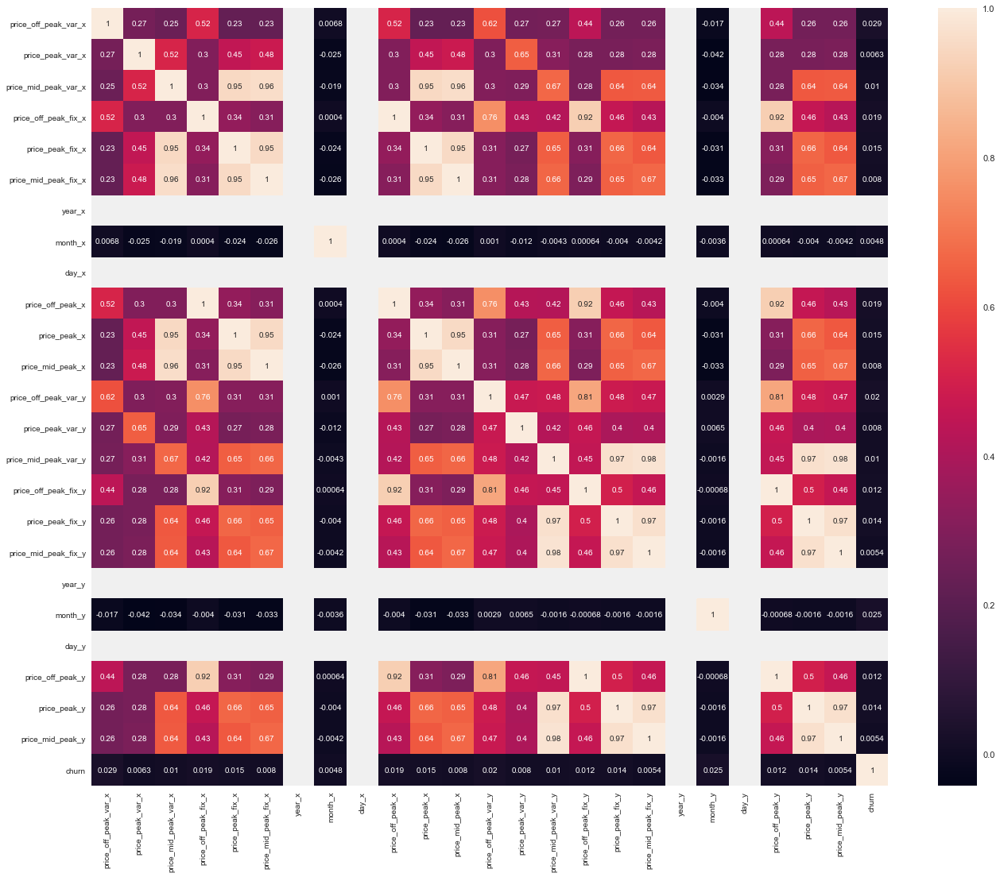

In [34]:
corr = price_analysis.corr()
# Plot correlation
plt.figure(figsize=(20,18))
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot = True, annot_kws={'size':10})
# Axis ticks size
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()


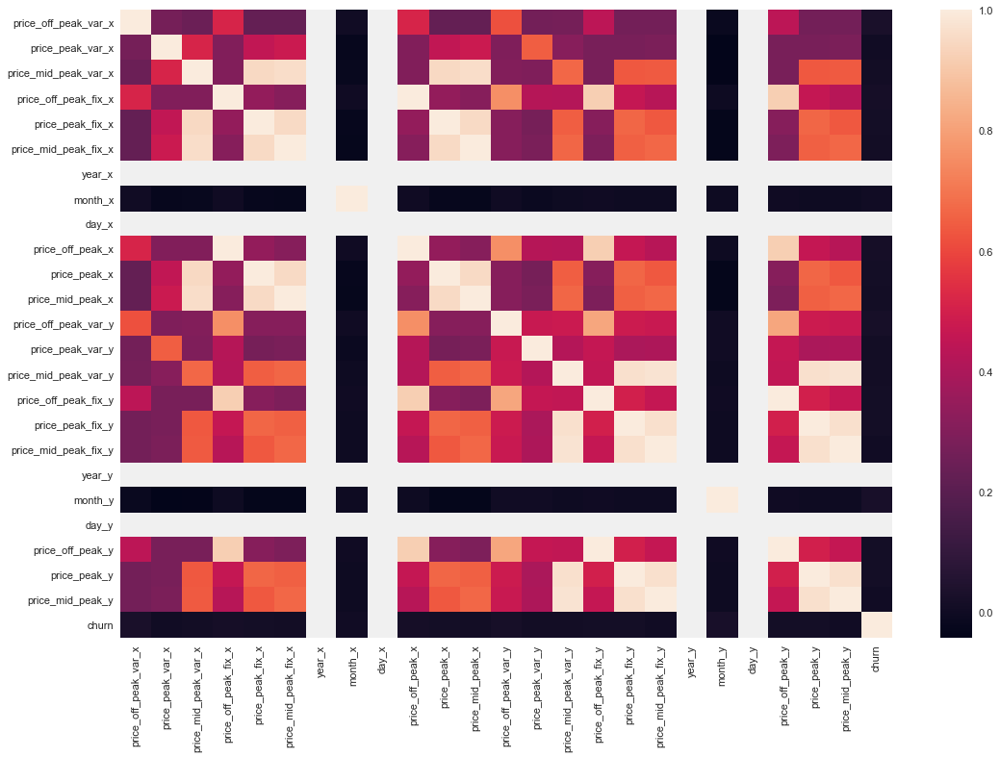

In [35]:
corr_data = price_analysis.corr()
plt.figure(figsize=(16, 12))
sns.heatmap(corr_data);

The above heatmap shows clearing that there is no correlation between churn and price sensitivity, further analysis will be require to justify the hypothesis.
Although strong correlation in some cases between the prices can be observed.

In [36]:
# processed data is mergerd and save after the churn column is droped
merged_data = pd.merge(client_data.drop(columns=['churn']), price_analysis,on='id')

In [37]:
 merged_data.to_csv('clean_data_after_eda.csv')

# Feature Engineering

In [38]:
df = pd.read_csv('./clean_data_after_eda.csv')
df["date_activ"] = pd.to_datetime(df["date_activ"], format='%Y-%m-%d')
df["date_end"] = pd.to_datetime(df["date_end"], format='%Y-%m-%d')
df["date_modif_prod"] = pd.to_datetime(df["date_modif_prod"], format='%Y-%m-%d')
df["date_renewal"] = pd.to_datetime(df["date_renewal"], format='%Y-%m-%d')


In [39]:
#Difference between off-peak prices in December and preceding January
price_df = pd.read_csv('price_data.csv')
price_df["price_date"] = pd.to_datetime(price_df["price_date"],format='%Y-%m-%d')
price_df.head()


,id,price_date,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
0,038af19179925da21a25619c5a24b745,2015-01-01,0.151367,0.0,0.0,44.266931,0.0,0.0
1,038af19179925da21a25619c5a24b745,2015-02-01,0.151367,0.0,0.0,44.266931,0.0,0.0
2,038af19179925da21a25619c5a24b745,2015-03-01,0.151367,0.0,0.0,44.266931,0.0,0.0
3,038af19179925da21a25619c5a24b745,2015-04-01,0.149626,0.0,0.0,44.266931,0.0,0.0
4,038af19179925da21a25619c5a24b745,2015-05-01,0.149626,0.0,0.0,44.266931,0.0,0.0


In [40]:
# Group off-peak prices by companies and month
monthly_price_by_id = price_df.groupby(['id', 'price_date']).agg({'price_off_peak_var': 'mean', 'price_off_peak_fix': 'mean'}).reset_index()
# Get january and december prices
jan_prices = monthly_price_by_id.groupby('id').first().reset_index()
dec_prices = monthly_price_by_id.groupby('id').last().reset_index()
# Calculate the difference
diff = pd.merge(dec_prices.rename(columns={'price_off_peak_var': 'dec_1','price_off_peak_fix': 'dec_2'}), jan_prices.drop(columns='price_date'),on='id')
diff['offpeak_diff_dec_january_energy'] = diff['dec_1'] -diff['price_off_peak_var']
diff['offpeak_diff_dec_january_power'] = diff['dec_2'] -diff['price_off_peak_fix']
diff = diff[['id','offpeak_diff_dec_january_energy','offpeak_diff_dec_january_power']]
diff.head()

,id,offpeak_diff_dec_january_energy,offpeak_diff_dec_january_power
0,0002203ffbb812588b632b9e628cc38d,-0.006192,0.162916
1,0004351ebdd665e6ee664792efc4fd13,-0.004104,0.177779
2,0010bcc39e42b3c2131ed2ce55246e3c,0.050443,1.500000
3,0010ee3855fdea87602a5b7aba8e42de,-0.010018,0.162916
4,00114d74e963e47177db89bc70108537,-0.003994,-0.000001


In [41]:
df.head()

,Unnamed: 0,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,...,price_off_peak_fix_y,price_peak_fix_y,price_mid_peak_fix_y,year_y,month_y,day_y,price_off_peak_y,price_peak_y,price_mid_peak_y,churn
0,0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,...,2.086294,99.530517,44.235794,0.0,3.5,0.0,2.086425,9.953056e+01,4.423670e+01,1
1,1,d29c2c54acc38ff3c0614d0a653813dd,MISSING,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,...,0.009482,0.000000,0.000000,0.0,3.5,0.0,0.009485,1.217891e-03,0.000000e+00,0
2,2,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,...,0.000000,0.000000,0.000000,0.0,3.5,0.0,0.000004,9.450150e-08,0.000000e+00,0
3,3,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,...,0.000000,0.000000,0.000000,0.0,3.5,0.0,0.000003,0.000000e+00,0.000000e+00,0
4,4,149d57cf92fc41cf94415803a877cb4b,MISSING,4425,0,526,2010-01-13,2016-03-07,2010-01-13,2015-03-09,...,0.000000,0.000000,0.000000,0.0,3.5,0.0,0.000011,2.896760e-06,4.860000e-10,0


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14606 entries, 0 to 14605
Data columns (total 54 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      14606 non-null  int64         
 1   id                              14606 non-null  object        
 2   channel_sales                   14606 non-null  object        
 3   cons_12m                        14606 non-null  int64         
 4   cons_gas_12m                    14606 non-null  int64         
 5   cons_last_month                 14606 non-null  int64         
 6   date_activ                      14606 non-null  datetime64[ns]
 7   date_end                        14606 non-null  datetime64[ns]
 8   date_modif_prod                 14606 non-null  datetime64[ns]
 9   date_renewal                    14606 non-null  datetime64[ns]
 10  forecast_cons_12m               14606 non-null  float64       
 11  fo

In [43]:
# Group off-peak forecast by companies and month
monthly_forecast_by_id = df.groupby(['id', 'channel_sales']).agg({'forecast_price_energy_off_peak': 'mean', 'forecast_price_energy_peak': 'mean'}).reset_index()
# Get  forecast
forecast_price_energy = monthly_forecast_by_id.groupby('id').first().reset_index()
forecast_price_energy.head() 

,id,channel_sales,forecast_price_energy_off_peak,forecast_price_energy_peak
0,0002203ffbb812588b632b9e628cc38d,foosdfpfkusacimwkcsosbicdxkicaua,0.116900,0.100015
1,0004351ebdd665e6ee664792efc4fd13,MISSING,0.142065,0.000000
2,0010bcc39e42b3c2131ed2ce55246e3c,usilxuppasemubllopkaafesmlibmsdf,0.199230,0.000000
3,00114d74e963e47177db89bc70108537,ewpakwlliwisiwduibdlfmalxowmwpci,0.144149,0.000000
4,0013f326a839a2f6ad87a1859952d227,foosdfpfkusacimwkcsosbicdxkicaua,0.118636,0.101750


In [44]:
# Group off-peak forecast by companies and month
monthly_forecast_by_id = df.groupby(['id', 'channel_sales']).agg({'forecast_cons_12m': 'mean', 'forecast_cons_year': 'mean'}).reset_index()
# Get  forecast
forecast_con_yr = monthly_forecast_by_id.groupby('id').first().reset_index()
forecast_con_yr.head() 

,id,channel_sales,forecast_cons_12m,forecast_cons_year
0,0002203ffbb812588b632b9e628cc38d,foosdfpfkusacimwkcsosbicdxkicaua,729.06,425
1,0004351ebdd665e6ee664792efc4fd13,MISSING,597.77,0
2,0010bcc39e42b3c2131ed2ce55246e3c,usilxuppasemubllopkaafesmlibmsdf,1311.16,1062
3,00114d74e963e47177db89bc70108537,ewpakwlliwisiwduibdlfmalxowmwpci,1671.41,0
4,0013f326a839a2f6ad87a1859952d227,foosdfpfkusacimwkcsosbicdxkicaua,3077.34,1760


In [45]:
# Group off-peak forecast by companies and month
monthly_margin_by_id = df.groupby(['id', 'channel_sales']).agg({'margin_gross_pow_ele': 'mean', 'margin_net_pow_ele': 'mean'}).reset_index()
# Get  forecast
margin_con_yr = monthly_margin_by_id.groupby('id').first().reset_index()
margin_con_yr.head() 

,id,channel_sales,margin_gross_pow_ele,margin_net_pow_ele
0,0002203ffbb812588b632b9e628cc38d,foosdfpfkusacimwkcsosbicdxkicaua,43.08,43.08
1,0004351ebdd665e6ee664792efc4fd13,MISSING,24.42,24.42
2,0010bcc39e42b3c2131ed2ce55246e3c,usilxuppasemubllopkaafesmlibmsdf,38.58,38.58
3,00114d74e963e47177db89bc70108537,ewpakwlliwisiwduibdlfmalxowmwpci,29.76,29.76
4,0013f326a839a2f6ad87a1859952d227,foosdfpfkusacimwkcsosbicdxkicaua,30.00,30.00


In [46]:
#Copy dataframes
df_client = df.copy()
df_price = price_df.copy()

In [47]:
#combine both the client and price data frames together
power_df = pd.merge(df_client, df_price,on='id')

In [48]:
#store data Id for later use
ID_power_df = power_df['id']

#power_df.drop("id", axis = 1, inplace = True)
power_df.head()

,Unnamed: 0,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,...,price_peak_y,price_mid_peak_y,churn,price_date,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
0,0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,...,99.530558,44.236702,1,2015-01-01,0.125976,0.103395,0.071536,40.565969,24.339581,16.226389
1,0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,...,99.530558,44.236702,1,2015-02-01,0.125976,0.103395,0.071536,40.565969,24.339581,16.226389
2,0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,...,99.530558,44.236702,1,2015-03-01,0.125976,0.103395,0.071536,40.565973,24.339578,16.226383
3,0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,...,99.530558,44.236702,1,2015-04-01,0.125976,0.103395,0.071536,40.565973,24.339578,16.226383
4,0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,...,99.530558,44.236702,1,2015-05-01,0.125976,0.103395,0.071536,40.565973,24.339578,16.226383


In [49]:
# Since the below features have no correlation to the taget result, they can be droped
df_reduced = power_df.drop(['margin_gross_pow_ele','date_end','origin_up','date_activ',
                            'date_renewal','year','nb_prod_act','date_modif_prod','price_date'],axis = 1)


Skewness: 2.721894
Kurtosis: 5.408768



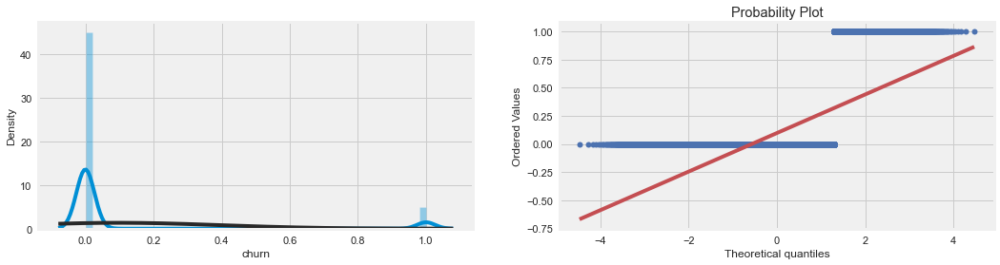

In [50]:
print("Skewness: %f" % df_reduced['churn'].skew())
print("Kurtosis: %f" % df_reduced['churn'].kurt())
print()
fig, ax = plt.subplots(1,2, figsize=(16,4))
sns.distplot(df_reduced['churn'] , fit=norm, ax=ax[0])
#Get also the QQ-plot
res = stats.probplot(df_reduced['churn'],plot=ax[1])
plt.show()

In [51]:
#Using oneHotEncoding for all categorical features
categorical_data = df_reduced.select_dtypes(include='object').copy()
df_reduced = df_reduced.copy()
for c in categorical_data:
    label_encoder = LabelEncoder() 
    label_encoder.fit(list(df_reduced[c].values)) 
    df_reduced[c] = label_encoder.transform(list(df_reduced[c].values))
    
df_reduced=df_reduced.copy()
#df_reduced.drop(df_reduced['Unnamed'])
df_reduced.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 175149 entries, 0 to 175148
Data columns (total 52 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Unnamed: 0                      175149 non-null  int64  
 1   id                              175149 non-null  int32  
 2   channel_sales                   175149 non-null  int32  
 3   cons_12m                        175149 non-null  int64  
 4   cons_gas_12m                    175149 non-null  int64  
 5   cons_last_month                 175149 non-null  int64  
 6   forecast_cons_12m               175149 non-null  float64
 7   forecast_cons_year              175149 non-null  int64  
 8   forecast_discount_energy        175149 non-null  float64
 9   forecast_meter_rent_12m         175149 non-null  float64
 10  forecast_price_energy_off_peak  175149 non-null  float64
 11  forecast_price_energy_peak      175149 non-null  float64
 12  forecast_price_p

In [52]:
#df_reduced = np.log10(df_reduced)
df_reduced.head()

,Unnamed: 0,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,...,price_off_peak_y,price_peak_y,price_mid_peak_y,churn,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
0,0,2117,4,0,54946,0,0.0,0,0.0,1.78,...,2.086425,99.530558,44.236702,1,0.125976,0.103395,0.071536,40.565969,24.339581,16.226389
1,0,2117,4,0,54946,0,0.0,0,0.0,1.78,...,2.086425,99.530558,44.236702,1,0.125976,0.103395,0.071536,40.565969,24.339581,16.226389
2,0,2117,4,0,54946,0,0.0,0,0.0,1.78,...,2.086425,99.530558,44.236702,1,0.125976,0.103395,0.071536,40.565973,24.339578,16.226383
3,0,2117,4,0,54946,0,0.0,0,0.0,1.78,...,2.086425,99.530558,44.236702,1,0.125976,0.103395,0.071536,40.565973,24.339578,16.226383
4,0,2117,4,0,54946,0,0.0,0,0.0,1.78,...,2.086425,99.530558,44.236702,1,0.125976,0.103395,0.071536,40.565973,24.339578,16.226383


Skewness: 2.721894
Kurtosis: 5.408768



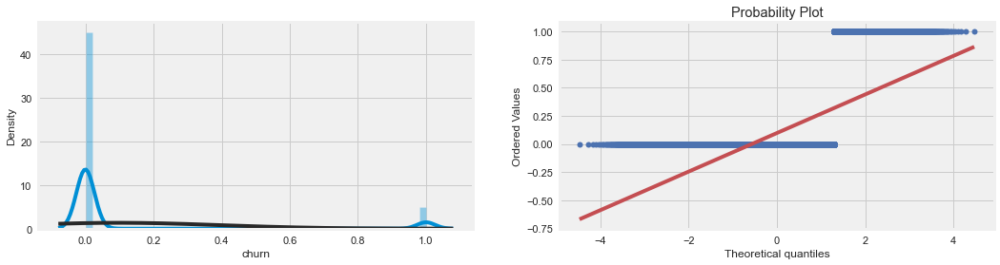

In [53]:
print("Skewness: %f" % df_reduced['churn'].skew())
print("Kurtosis: %f" % df_reduced['churn'].kurt())
print()
fig, ax = plt.subplots(1,2, figsize=(16,4))
sns.distplot(df_reduced['churn'] , fit=norm, ax=ax[0])
#Get also the QQ-plot
res = stats.probplot(df_reduced['churn'],plot=ax[1])
plt.show()

In [54]:
#spit the dataframe into train and test data
from sklearn.model_selection import train_test_split
y = df_reduced['churn']
X_train, X_test, y_train, y_test = train_test_split(df_reduced,y,test_size=0.2,random_state=1, stratify=y)


In [55]:
from sklearn.model_selection import KFold,cross_val_score
from sklearn.metrics import make_scorer,r2_score
from sklearn.metrics import mean_squared_error

def test_model(model, X_train=X_train, y_train=y_train):
    cv = KFold(n_splits=7,shuffle=True,random_state=42)
    r2 = make_scorer(r2_score)
    r2_val_score = cross_val_score(model,X_train,y_train,cv=cv,scoring=r2)
    score = [r2_val_score.mean()]
    return score

In [56]:
from sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(random_state = 42)
RF.fit(X_train,y_train)


RandomForestClassifier(random_state=42)

In [57]:
print(test_model(RF))
print(RF.score(X_test, y_test))

[1.0]
1.0


In [59]:
y_pred = np.array(RF.predict(X_test))

In [60]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred)

array([[31629,     0],
       [    0,  3401]], dtype=int64)

In [61]:
# View accuracy score
accuracy_score(y_test, y_pred)

1.0

In [62]:
# View the classification report for test data and predictions
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31629
           1       1.00      1.00      1.00      3401

    accuracy                           1.00     35030
   macro avg       1.00      1.00      1.00     35030
weighted avg       1.00      1.00      1.00     35030



In [63]:
from sklearn.metrics import mean_squared_error
print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

Mean Squared Error: 0.0
Root Mean Squared Error: 0.0


In [64]:
predictions = pd.DataFrame()
predictions["y_test"] = y_test
predictions["y_pred"] = y_pred
predictions

,y_test,y_pred
117343,0,0
112323,0,0
79033,1,1
26724,0,0
122773,0,0
...,...,...
14064,1,1
108330,0,0
87217,0,0
39678,0,0
